
# Ch 0.1: StableDiffusionPipeline
This notebook aims to understanding StableDiffusionPipeline code using a top-down approach. As a result, you can also find out how the diffusion model is generating images. We'll start with a broad overview and then delve into the specifics, providing actural code and pseudo-code to aid understanding.

Finally, as a practical application of our understanding, we'll embark on creating a `pared` features `diffusers` library named `PareDiffusers`. We will realize image generation using functions from '[huggingface/diffusers](https://github.com/huggingface/diffusers/tree/main)', and then gradually replace small components with code written in torch to understand how works. Eventually, we will create a library called PareDiffusers, which has minimal functionality and does not use diffusers.


**Outside Good Recourses to Understand Diffusion Models**

Before reading this notebook or after reading this notebook, I recommend you to read the following articles. These articles are very helpful to understand diffusion models.
- [The Illustrated Stable Diffusion](https://jalammar.github.io/illustrated-stable-diffusion/)
- [Introduction to Diffusion Models for Machine Learning](https://www.assemblyai.com/blog/diffusion-models-for-machine-learning-introduction/)
- [How diffusion models work: the math from scratch](https://theaisummer.com/diffusion-models/)


## Part 0: Setup

In [1]:
# Install diffusers
!pip install transformers diffusers accelerate -U

In [2]:
import torch
from torchvision.transforms import ToPILImage

device = torch.device("cuda")
dtype = torch.float16

def tensor_to_image(tensor):
	return ToPILImage()(tensor.detach().cpu())

## Part 1: Running the StableDiffusionPipeline to generate images from text

/usr/local/lib/python3.10/dist-packages/flax/struct.py:136: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/usr/local/lib/python3.10/dist-packages/flax/struct.py:136: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/usr/local/lib/python3.10/dist-packages/flax/struct.py:136: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

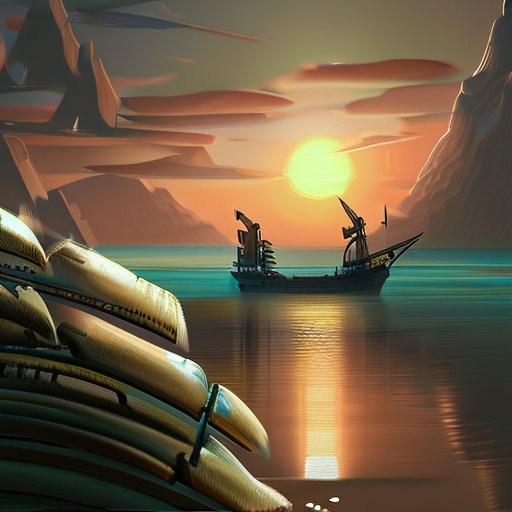

In [3]:
import torch
from diffusers import StableDiffusionPipeline

device = torch.device("cuda")
dtype = torch.float16

pipe = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2").to(
	device=device,
	dtype=dtype,
)
prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"

image = pipe(prompt, width=512, height=512).images[0]
display(image)

The above code is a quickstart to generating an image from text using the StableDiffusionPipeline. Let's break down what each part does:

1. **Importing the Library**: We import the `StableDiffusionPipeline` class from the diffusers library.
2. **Loading the Model**: `StableDiffusionPipeline.from_pretrained` is used to load a pre-trained version of the stable diffusion model.
3. **Setting Device**: `.to("cuda")` moves our model to the GPU for faster processing.
4. **Creating a Prompt**: `prompt` variable holds the textual description of the image you want to generate.
5. **Generating the Image**: The `pipe(prompt)` call generates the image, which is then accessed via `.images[0]`.
6. **Displaying the Image**: Finally, `display(image)` shows the generated image.

Now that we've seen the pipeline in action, let's dive into its internal workings.

## Part 2: Understanding the StableDiffusionPipeline Structure

Code of the StableDiffusionPipeline is available in the [here](https://github.com/huggingface/diffusers/blob/main/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py).

The method which generate image is the [__call__](https://github.com/huggingface/diffusers/blob/79c380bc80051d8f82a38c3a7df6f8f4efd1633d/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py#L775C5-L1063C99).


The code below has been simplified to allow only image generation from the prompt.

- batch_size is fixed to 1 and cannot be changed.
- num_images_per_prompt is fixed to 1 and cannot be changed.

In addition, various parameters and functions will be deleted to make txt2img possible at the bare minimum.



  0%|          | 0/50 [00:00<?, ?it/s]

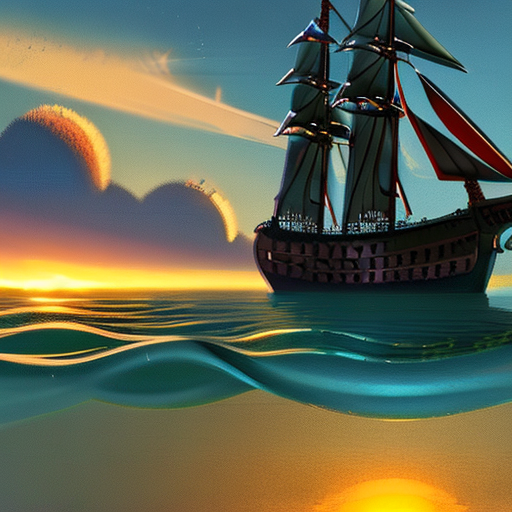

In [4]:
def retrieve_timesteps(
	scheduler,
	num_inference_steps=None,
):
	scheduler.set_timesteps(num_inference_steps, device=pipe.device)
	timesteps = scheduler.timesteps
	return timesteps, num_inference_steps


@torch.no_grad()
def __call__(
	prompt="",
	height=512,
	width=512,
	num_inference_steps=50,
	timesteps=None,
	guidance_scale=7.5,
	negative_prompt=None,
	num_images_per_prompt=1,
	generator=None,
	latents=None,
	prompt_embeds=None,
	negative_prompt_embeds=None,
	guidance_rescale=0.0,
):
	pipe._guidance_scale = guidance_scale
	pipe._guidance_rescale = guidance_rescale
	pipe._clip_skip = None
	pipe._cross_attention_kwargs = None
	pipe._interrupt = False

	device = pipe._execution_device

	# 3. Encode input prompt
	prompt_embeds, negative_prompt_embeds = pipe.encode_prompt(
		prompt,
		device,
		num_images_per_prompt,
		pipe.do_classifier_free_guidance,
		negative_prompt,
	)

	prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])

	# 4. Prepare timesteps
	timesteps, num_inference_steps = retrieve_timesteps(
		pipe.scheduler, num_inference_steps
	)

	# 5. Prepare latent variables
	num_channels_latents = pipe.unet.config.in_channels
	latents = pipe.prepare_latents(
		1,
		num_channels_latents,
		height,
		width,
		prompt_embeds.dtype,
		device,
		generator,
		latents,
	)

	# 7. Denoising loop
	num_warmup_steps = len(timesteps) - \
		num_inference_steps * pipe.scheduler.order
	pipe._num_timesteps = len(timesteps)
	with pipe.progress_bar(total=num_inference_steps) as progress_bar:
		for i, t in enumerate(timesteps):
			if pipe.interrupt:
				continue

			# expand the latents if we are doing classifier free guidance
			latent_model_input = torch.cat(
				[latents] * 2) if pipe.do_classifier_free_guidance else latents
			latent_model_input = pipe.scheduler.scale_model_input(
				latent_model_input, t)

			# predict the noise residual
			noise_pred = pipe.unet(
				latent_model_input,
				t,
				encoder_hidden_states=prompt_embeds,
				return_dict=False,
			)[0]

			# perform guidance
			noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
			noise_pred = noise_pred_uncond + pipe.guidance_scale * \
				(noise_pred_text - noise_pred_uncond)

			# compute the previous noisy sample x_t -> x_t-1
			latents = pipe.scheduler.step(
				noise_pred, t, latents, return_dict=False
			)[0]

			# call the callback, if provided
			if i == len(timesteps) - 1 or ((i + 1) > num_warmup_steps and (i + 1) % pipe.scheduler.order == 0):
				progress_bar.update()

	image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor, return_dict=False, generator=generator)[0]
	do_denormalize = [True] * image.shape[0]
	image = pipe.image_processor.postprocess(
		image, output_type="pil", do_denormalize=do_denormalize
	)
	return image


prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"

image = __call__(prompt=prompt)[0]
display(image)

By reading the above code, we can understand the flow to generate an image, so next, I will divide the image generation process into four steps: 

1. encode_prompt
2. get_latents
3. denoise
4. vae_decode.

### Part 2.1: encode_prompt
Prompt is text data so we need to convert it to data which model can handle. Thus, by encode_prompt, we convert it to a vector that represents the meaning of prompt.

#### Check pipe.encode_prompt return value


In [5]:
original_prompt_embeds, original_negative_prompt_embeds = pipe.encode_prompt(
	prompt,
	device,
	1,
	pipe.do_classifier_free_guidance,
	None,
)

print("prompt_embeds.shape", original_prompt_embeds.shape)
print(original_prompt_embeds)
print()
print("negative_prompt_embeds.shape", original_negative_prompt_embeds.shape)
print(original_negative_prompt_embeds)
print()

original_prompt_embeds = torch.cat([original_negative_prompt_embeds, original_prompt_embeds])
print("\nAfter concatenates, prompt_embeds.shape", original_prompt_embeds.shape)
print(original_prompt_embeds)


prompt_embeds.shape torch.Size([1, 77, 1024])
tensor([[[-0.3135, -0.4475, -0.0082,  ...,  0.2544, -0.0326, -0.2959],
         [ 0.6050, -0.9858, -0.6758,  ...,  1.6953, -0.1364, -0.3333],
         [-0.1305, -0.3596, -0.1381,  ...,  0.5254, -0.8174,  0.8154],
         ...,
         [ 0.4783, -1.6445,  0.7104,  ..., -0.0329, -0.2935,  0.4041],
         [ 0.4761, -1.6924,  0.7217,  ..., -0.2120, -0.3604,  0.5034],
         [ 0.5850, -2.2852,  0.3594,  ..., -0.2229,  0.1344,  0.7227]]],
       device='cuda:0', dtype=torch.float16, grad_fn=<ViewBackward0>)

negative_prompt_embeds.shape torch.Size([1, 77, 1024])
tensor([[[-3.1348e-01, -4.4751e-01, -8.1558e-03,  ...,  2.5439e-01,
          -3.2593e-02, -2.9590e-01],
         [ 1.4102e+00,  8.4686e-03, -4.2993e-01,  ...,  1.0361e+00,
          -6.7529e-01,  1.5010e+00],
         [ 1.8662e+00, -1.0908e+00, -1.0586e+00,  ...,  2.0312e+00,
          -1.1436e+00, -1.8933e-01],
         ...,
         [ 2.8915e-03, -1.5000e+00, -3.8818e-01,  ..., -1

#### Write encode_prompt function

In [6]:
def encode_prompt(prompt):
	text_inputs = pipe.tokenizer(
		prompt,
		padding="max_length",
		max_length=pipe.tokenizer.model_max_length,
		truncation=True,
		return_tensors="pt",
	)
	text_input_ids = text_inputs.input_ids

	attention_mask = None

	prompt_embeds = pipe.text_encoder(text_input_ids.to(device), attention_mask=attention_mask)
	prompt_embeds = prompt_embeds[0]

	prompt_embeds_dtype = pipe.text_encoder.dtype
	prompt_embeds = prompt_embeds.to(dtype=prompt_embeds_dtype, device=device)

	bs_embed, seq_len, _ = prompt_embeds.shape
	# duplicate text embeddings for each generation per prompt, using mps friendly method
	prompt_embeds = prompt_embeds.repeat(1, 1, 1)
	prompt_embeds = prompt_embeds.view(bs_embed * 1, seq_len, -1)

	# get unconditional embeddings for classifier free guidance
	max_length = prompt_embeds.shape[1]
	uncond_input = pipe.tokenizer(
		[''],
		padding="max_length",
		max_length=max_length,
		truncation=True,
		return_tensors="pt",
	)

	attention_mask = None

	negative_prompt_embeds = pipe.text_encoder(
		uncond_input.input_ids.to(device),
		attention_mask=attention_mask,
	)
	negative_prompt_embeds = negative_prompt_embeds[0]

	# duplicate unconditional embeddings for each generation per prompt, using mps friendly method
	seq_len = negative_prompt_embeds.shape[1]

	negative_prompt_embeds = negative_prompt_embeds.to(dtype=prompt_embeds_dtype, device=device)

	negative_prompt_embeds = negative_prompt_embeds.repeat(1, 1, 1)
	negative_prompt_embeds = negative_prompt_embeds.view(1, seq_len, -1)

	return prompt_embeds, negative_prompt_embeds


prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"
prompt_embeds, negative_prompt_embeds = encode_prompt(prompt)

print("prompt_embeds.shape", prompt_embeds.shape)
print(prompt_embeds)
print()
print("negative_prompt_embeds.shape", negative_prompt_embeds.shape)
print(negative_prompt_embeds)

prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])
print("\nAfter concatenates, prompt_embeds.shape", prompt_embeds.shape)
print(prompt_embeds)

prompt_embeds.shape torch.Size([1, 77, 1024])
tensor([[[-0.3135, -0.4475, -0.0082,  ...,  0.2544, -0.0326, -0.2959],
         [ 0.6050, -0.9858, -0.6758,  ...,  1.6953, -0.1364, -0.3333],
         [-0.1305, -0.3596, -0.1381,  ...,  0.5254, -0.8174,  0.8154],
         ...,
         [ 0.4783, -1.6445,  0.7104,  ..., -0.0329, -0.2935,  0.4041],
         [ 0.4761, -1.6924,  0.7217,  ..., -0.2120, -0.3604,  0.5034],
         [ 0.5850, -2.2852,  0.3594,  ..., -0.2229,  0.1344,  0.7227]]],
       device='cuda:0', dtype=torch.float16, grad_fn=<ViewBackward0>)

negative_prompt_embeds.shape torch.Size([1, 77, 1024])
tensor([[[-3.1348e-01, -4.4751e-01, -8.1558e-03,  ...,  2.5439e-01,
          -3.2593e-02, -2.9590e-01],
         [ 1.4102e+00,  8.4686e-03, -4.2993e-01,  ...,  1.0361e+00,
          -6.7529e-01,  1.5010e+00],
         [ 1.8662e+00, -1.0908e+00, -1.0586e+00,  ...,  2.0312e+00,
          -1.1436e+00, -1.8933e-01],
         ...,
         [ 2.8915e-03, -1.5000e+00, -3.8818e-01,  ..., -1

In [7]:
# Check equal to original
print("Equal to original_prompt_embeds:", torch.equal(original_prompt_embeds, prompt_embeds))

Equal to original_prompt_embeds: True


#### Overwrite pipe.encode_prompt of __call__

  0%|          | 0/50 [00:00<?, ?it/s]

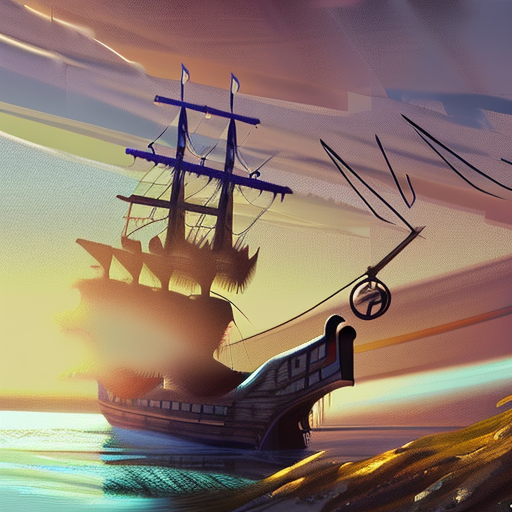

In [8]:
def retrieve_timesteps(
	scheduler,
	num_inference_steps=None,
):
	scheduler.set_timesteps(num_inference_steps, device=pipe.device)
	timesteps = scheduler.timesteps
	return timesteps, num_inference_steps


@torch.no_grad()
def __call__(
	prompt="",
	height=512,
	width=512,
	num_inference_steps=50,
	timesteps=None,
	guidance_scale=7.5,
	generator=None,
	latents=None,
	prompt_embeds=None,
	negative_prompt_embeds=None,
	guidance_rescale=0.0,
):
	pipe._guidance_scale = guidance_scale
	pipe._guidance_rescale = guidance_rescale
	pipe._clip_skip = None
	pipe._cross_attention_kwargs = None
	pipe._interrupt = False

	device = pipe._execution_device

	# 3. OVERWRITE Encode input prompt
	prompt_embeds, negative_prompt_embeds = encode_prompt(prompt)

	prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])

	# 4. Prepare timesteps
	timesteps, num_inference_steps = retrieve_timesteps(
		pipe.scheduler, num_inference_steps
	)

	# 5. Prepare latent variables
	num_channels_latents = pipe.unet.config.in_channels
	latents = pipe.prepare_latents(
		1,
		num_channels_latents,
		height,
		width,
		prompt_embeds.dtype,
		device,
		generator,
		latents,
	)

	# 7. Denoising loop
	num_warmup_steps = len(timesteps) - \
		num_inference_steps * pipe.scheduler.order
	pipe._num_timesteps = len(timesteps)
	with pipe.progress_bar(total=num_inference_steps) as progress_bar:
		for i, t in enumerate(timesteps):
			if pipe.interrupt:
				continue

			# expand the latents if we are doing classifier free guidance
			latent_model_input = torch.cat(
				[latents] * 2) if pipe.do_classifier_free_guidance else latents
			latent_model_input = pipe.scheduler.scale_model_input(
				latent_model_input, t)

			# predict the noise residual
			noise_pred = pipe.unet(
				latent_model_input,
				t,
				encoder_hidden_states=prompt_embeds,
				return_dict=False,
			)[0]

			# perform guidance
			noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
			noise_pred = noise_pred_uncond + pipe.guidance_scale * \
				(noise_pred_text - noise_pred_uncond)

			# compute the previous noisy sample x_t -> x_t-1
			latents = pipe.scheduler.step(
				noise_pred, t, latents, return_dict=False
			)[0]

			# call the callback, if provided
			if i == len(timesteps) - 1 or ((i + 1) > num_warmup_steps and (i + 1) % pipe.scheduler.order == 0):
				progress_bar.update()

	image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor, return_dict=False, generator=generator)[0]
	do_denormalize = [True] * image.shape[0]
	image = pipe.image_processor.postprocess(
		image, output_type="pil", do_denormalize=do_denormalize
	)
	return image


prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"

image = __call__(prompt=prompt)[0]
display(image)

### Part 2.2: get_latent
latent is a tensor of size [batch_size, 1, width, height] and is initialized with random values. Diffusion models gradually denoise this latent to generate an image.

torch.Size([4, 64, 64])


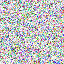

In [9]:
def get_latent(width, height):
	return torch.randn((4, width // 8, height // 8)).to(
		device=device, dtype=dtype
	)

width = 512
height = 512
latent = get_latent(width, height)
# latents = latent.unsqueeze(dim=0) # Shape: (1, 4, 64, 64)

print(latent.shape)
display(tensor_to_image(latent))

Overwrite pipe.prepare_latents of __call__

  0%|          | 0/50 [00:00<?, ?it/s]

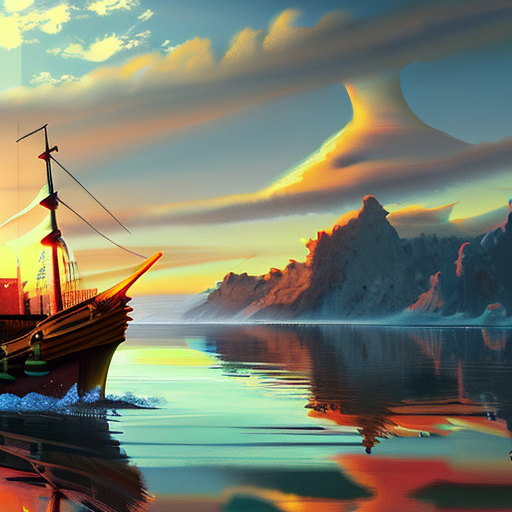

In [10]:
def retrieve_timesteps(
	scheduler,
	num_inference_steps=None,
):
	scheduler.set_timesteps(num_inference_steps, device=pipe.device)
	timesteps = scheduler.timesteps
	return timesteps, num_inference_steps


@torch.no_grad()
def __call__(
	prompt="",
	height=512,
	width=512,
	num_inference_steps=50,
	timesteps=None,
	guidance_scale=7.5,
	generator=None,
	latents=None,
	prompt_embeds=None,
	negative_prompt_embeds=None,
	guidance_rescale=0.0,
):
	pipe._guidance_scale = guidance_scale
	pipe._guidance_rescale = guidance_rescale
	pipe._clip_skip = None
	pipe._cross_attention_kwargs = None
	pipe._interrupt = False

	# 3. OVERWRITE Encode input prompt
	prompt_embeds, negative_prompt_embeds = encode_prompt(prompt)

	prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])

	# 4. Prepare timesteps
	timesteps, num_inference_steps = retrieve_timesteps(
		pipe.scheduler, num_inference_steps
	)

	# 5. OVERWRITE Prepare latent variables
	latent = get_latent(width, height) # Shape: (4, 64, 64)
	latents = latent.unsqueeze(dim=0) # Shape: (1, 4, 64, 64)

	# 7. Denoising loop
	num_warmup_steps = len(timesteps) - \
		num_inference_steps * pipe.scheduler.order
	pipe._num_timesteps = len(timesteps)
	with pipe.progress_bar(total=num_inference_steps) as progress_bar:
		for i, t in enumerate(timesteps):
			if pipe.interrupt:
				continue

			# expand the latents if we are doing classifier free guidance
			latent_model_input = torch.cat(
				[latents] * 2) if pipe.do_classifier_free_guidance else latents
			latent_model_input = pipe.scheduler.scale_model_input(
				latent_model_input, t)

			# predict the noise residual
			noise_pred = pipe.unet(
				latent_model_input,
				t,
				encoder_hidden_states=prompt_embeds,
				return_dict=False,
			)[0]

			# perform guidance
			noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
			noise_pred = noise_pred_uncond + pipe.guidance_scale * \
				(noise_pred_text - noise_pred_uncond)

			# compute the previous noisy sample x_t -> x_t-1
			latents = pipe.scheduler.step(
				noise_pred, t, latents, return_dict=False
			)[0]

			# call the callback, if provided
			if i == len(timesteps) - 1 or ((i + 1) > num_warmup_steps and (i + 1) % pipe.scheduler.order == 0):
				progress_bar.update()

	image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor, return_dict=False, generator=generator)[0]
	do_denormalize = [True] * image.shape[0]
	image = pipe.image_processor.postprocess(
		image, output_type="pil", do_denormalize=do_denormalize
	)
	return image


prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"

image = __call__(prompt=prompt)[0]
display(image)

### Part 2.3: denoise
Denoise is the process of gradually denoising the latent to generate an image. The denoise process is repeated num_timesteps times.

#### Check denoise process

In [11]:
num_inference_steps = 50

def retrieve_timesteps(
	scheduler,
	num_inference_steps=None,
):
	scheduler.set_timesteps(num_inference_steps, device=pipe.device)
	timesteps = scheduler.timesteps
	return timesteps, num_inference_steps

timesteps, num_inference_steps = retrieve_timesteps(
	pipe.scheduler, num_inference_steps
)

print("timesteps.shape", timesteps.shape)
print(timesteps)
print()
print("num_inference_steps", num_inference_steps)


timesteps.shape torch.Size([50])
tensor([981, 961, 941, 921, 901, 881, 861, 841, 821, 801, 781, 761, 741, 721,
        701, 681, 661, 641, 621, 601, 581, 561, 541, 521, 501, 481, 461, 441,
        421, 401, 381, 361, 341, 321, 301, 281, 261, 241, 221, 201, 181, 161,
        141, 121, 101,  81,  61,  41,  21,   1], device='cuda:0')

num_inference_steps 50


In [12]:
num_warmup_steps = len(timesteps) - num_inference_steps * pipe.scheduler.order
pipe._num_timesteps = len(timesteps)

print("num_warmup_steps", num_warmup_steps)
print("pipe._num_timesteps", pipe._num_timesteps)

num_warmup_steps 0
pipe._num_timesteps 50


In [13]:
# Prepare variables before check denoise loop
latents = get_latent(width, height).unsqueeze(dim=0)
i = 0
t = timesteps[i]

print("latents.shape", latents.shape)
print("t", t)

latents.shape torch.Size([1, 4, 64, 64])
t tensor(981, device='cuda:0')


latent_model_input.shape torch.Size([2, 4, 64, 64])
latent_model_input.shape torch.Size([2, 4, 64, 64])

latent_model_input[0]


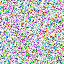

latent_model_input[1]


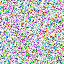

Equal to latent_model_input[0] and latent_model_input[1]: True


In [14]:
# expand the latents if we are doing classifier free guidance
latent_model_input = torch.cat(
	[latents] * 2) if pipe.do_classifier_free_guidance else latents

print("latent_model_input.shape", latent_model_input.shape)

latent_model_input = pipe.scheduler.scale_model_input(
	latent_model_input, t)

print("latent_model_input.shape", latent_model_input.shape)
print()
print("latent_model_input[0]")
display(tensor_to_image(latent_model_input[0]))
print("latent_model_input[1]")
display(tensor_to_image(latent_model_input[1]))

print("Equal to latent_model_input[0] and latent_model_input[1]:", torch.equal(latent_model_input[0], latent_model_input[1]))

U-Net


Good Recouses to understand U-Net
- [You Can’t Spell Diffusion without U](https://towardsdatascience.com/you-cant-spell-diffusion-without-u-60635f569579)

noise_pred.shape torch.Size([2, 4, 64, 64])

noise_pred[0]


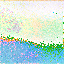

noise_pred[1]


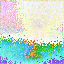

Equal to noise_pred[0] and noise_pred[1]: False
Equal to latent_model_input[0] and noise_pred[0]: False


In [15]:
# predict the noise residual
noise_pred = pipe.unet(
	latent_model_input,
	t,
	encoder_hidden_states=prompt_embeds,
	return_dict=False,
)[0]

print("noise_pred.shape", noise_pred.shape)
print()

print("noise_pred[0]")
display(tensor_to_image(noise_pred[0]))

print("noise_pred[1]")
display(tensor_to_image(noise_pred[1]))

print("Equal to noise_pred[0] and noise_pred[1]:", torch.equal(noise_pred[0], noise_pred[1]))
print("Equal to latent_model_input[0] and noise_pred[0]:", torch.equal(latent_model_input[0], noise_pred[0]))

#### perform guidance

noise_pred.shape torch.Size([1, 4, 64, 64])


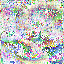

In [16]:
noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)

noise_pred = noise_pred_uncond + pipe.guidance_scale * \
	(noise_pred_text - noise_pred_uncond)

print("noise_pred.shape", noise_pred.shape)
display(tensor_to_image(noise_pred[0]))

#### compute the previous noisy sample x_t -> x_t-1

latents.shape torch.Size([1, 4, 64, 64])


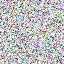

In [17]:
latents = pipe.scheduler.step(
	noise_pred, t, latents, return_dict=False
)[0]
print("latents.shape", latents.shape)

display(tensor_to_image(latents[0]))

#### Display intermediate images for every 10 Denoising steps
Display images is below:
- After `predict the noise residual`
- After `perform guidance`
- After `compute the previous noisy sample x_t -> x_t-1`

Also, keep latent for every 10 Denoising steps. It use next part, 2.4 vae_decode.

i: 0, t: 981


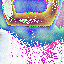

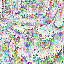

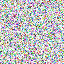

i: 10, t: 781


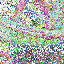

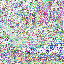

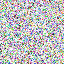

i: 20, t: 581


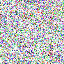

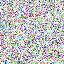

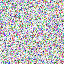

i: 30, t: 381


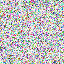

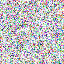

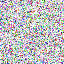

i: 40, t: 181


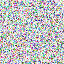

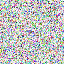

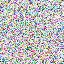

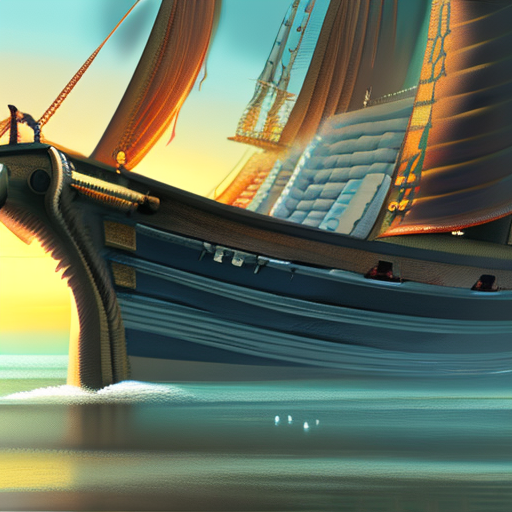

In [18]:
def retrieve_timesteps(
	scheduler,
	num_inference_steps=None,
):
	scheduler.set_timesteps(num_inference_steps, device=pipe.device)
	timesteps = scheduler.timesteps
	return timesteps, num_inference_steps

keep_latents = []

@torch.no_grad()
def __call__(
	prompt="",
	height=512,
	width=512,
	num_inference_steps=50,
	timesteps=None,
	guidance_scale=7.5,
	generator=None,
	latents=None,
	prompt_embeds=None,
	negative_prompt_embeds=None,
	guidance_rescale=0.0,
):
	global keep_latents
	pipe._guidance_scale = guidance_scale
	pipe._guidance_rescale = guidance_rescale
	pipe._clip_skip = None
	pipe._cross_attention_kwargs = None
	pipe._interrupt = False

	# 3. OVERWRITE Encode input prompt
	prompt_embeds, negative_prompt_embeds = encode_prompt(prompt)

	prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])

	# 4. Prepare timesteps
	timesteps, num_inference_steps = retrieve_timesteps(
		pipe.scheduler, num_inference_steps
	)

	# 5. OVERWRITE Prepare latent variables
	latent = get_latent(width, height) # Shape: (4, 64, 64)
	latents = latent.unsqueeze(dim=0) # Shape: (1, 4, 64, 64)

	# 7. Denoising loop
	pipe._num_timesteps = len(timesteps)
	for i, t in enumerate(timesteps):
		if i % 10 == 0:
			print(f"i: {i}, t: {t}")

		# expand the latents if we are doing classifier free guidance
		latent_model_input = torch.cat(
			[latents] * 2) if pipe.do_classifier_free_guidance else latents
		latent_model_input = pipe.scheduler.scale_model_input(
			latent_model_input, t)

		# predict the noise residual
		noise_pred = pipe.unet(
			latent_model_input,
			t,
			encoder_hidden_states=prompt_embeds,
			return_dict=False,
		)[0]
		if i % 10 == 0:
			display(tensor_to_image(noise_pred[0]))

		# perform guidance
		noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
		noise_pred = noise_pred_uncond + pipe.guidance_scale * \
			(noise_pred_text - noise_pred_uncond)
		if i % 10 == 0:
			display(tensor_to_image(noise_pred[0]))

		# compute the previous noisy sample x_t -> x_t-1
		latents = pipe.scheduler.step(
			noise_pred, t, latents, return_dict=False
		)[0]
		if i % 10 == 0:
			display(tensor_to_image(latents[0]))
			keep_latents.append(latents)


	image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor, return_dict=False, generator=generator)[0]
	do_denormalize = [True] * image.shape[0]
	image = pipe.image_processor.postprocess(
		image, output_type="pil", do_denormalize=do_denormalize
	)
	return image


prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"

image = __call__(prompt=prompt)[0]
display(image)

#### Write denoise function

In [19]:
def retrieve_timesteps(
	scheduler,
	num_inference_steps=None,
):
	scheduler.set_timesteps(num_inference_steps, device=pipe.device)
	timesteps = scheduler.timesteps
	return timesteps, num_inference_steps

@torch.no_grad()
def denoise(
	latents,
	prompt_embeds,
	num_inference_steps=50,
):
	timesteps, num_inference_steps = retrieve_timesteps(
		pipe.scheduler, num_inference_steps
	)
	pipe._num_timesteps = len(timesteps)

	for t in timesteps:
		# expand the latents if we are doing classifier free guidance
		latent_model_input = torch.cat(
			[latents] * 2) if pipe.do_classifier_free_guidance else latents
		latent_model_input = pipe.scheduler.scale_model_input(
			latent_model_input, t)

		# predict the noise residual
		noise_pred = pipe.unet(
			latent_model_input,
			t,
			encoder_hidden_states=prompt_embeds,
			return_dict=False,
		)[0]

		# perform guidance
		noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
		noise_pred = noise_pred_uncond + pipe.guidance_scale * \
			(noise_pred_text - noise_pred_uncond)

		# compute the previous noisy sample x_t -> x_t-1
		latents = pipe.scheduler.step(
			noise_pred, t, latents, return_dict=False
		)[0]
	return latents

#### Overwrite denoise loop of __call__

In [20]:
def retrieve_timesteps(
	scheduler,
	num_inference_steps=None,
):
	scheduler.set_timesteps(num_inference_steps, device=pipe.device)
	timesteps = scheduler.timesteps
	return timesteps, num_inference_steps

@torch.no_grad()
def __call__(
	prompt="",
	height=512,
	width=512,
	num_inference_steps=50,
	timesteps=None,
	guidance_scale=7.5,
	generator=None,
	latents=None,
	prompt_embeds=None,
	negative_prompt_embeds=None,
	guidance_rescale=0.0,
):
	pipe._guidance_scale = guidance_scale
	pipe._guidance_rescale = guidance_rescale
	pipe._clip_skip = None
	pipe._cross_attention_kwargs = None
	pipe._interrupt = False

	# 3. OVERWRITE Encode input prompt
	prompt_embeds, negative_prompt_embeds = encode_prompt(prompt)

	prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])

	# 5. OVERWRITE Prepare latent variables
	latent = get_latent(width, height) # Shape: (4, 64, 64)
	latents = latent.unsqueeze(dim=0) # Shape: (1, 4, 64, 64)

	# 7. OVERWRITE Denoising loop
	latents = denoise(latents, prompt_embeds, num_inference_steps)

	image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor, return_dict=False, generator=generator)[0]
	do_denormalize = [True] * image.shape[0]
	image = pipe.image_processor.postprocess(
		image, output_type="pil", do_denormalize=do_denormalize
	)
	return image


prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"

image = __call__(prompt=prompt)
display(image)

[<PIL.Image.Image image mode=RGB size=512x512>]

### Part 2.4: vae_decode
Variational Auto Encoder (VAE) is a model that can generate images from latent. In this part, we use VAE to generate images from latent.

#### Check vae decode from random latent

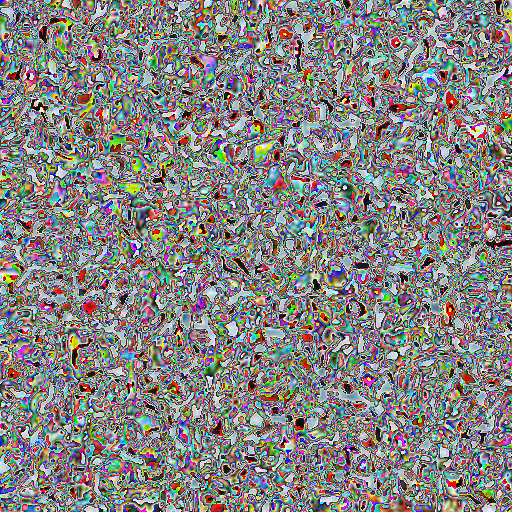

In [21]:
latents = get_latent(width, height).unsqueeze(dim=0)

image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor)[0]
display(tensor_to_image(image[0]))

#### Check vae decode from keep latent
Try latents after every 10 Denoising steps.

After 0 steps


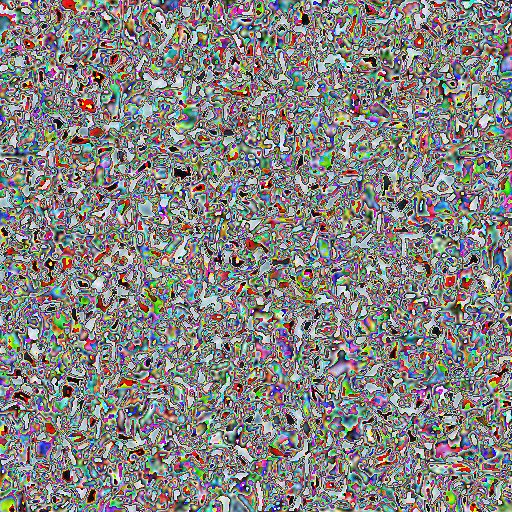

After 10 steps


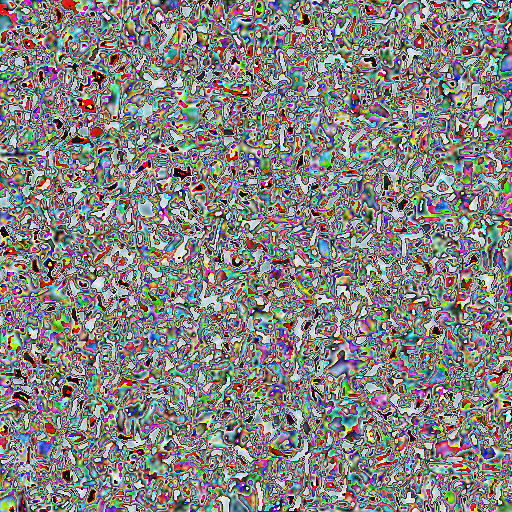

After 20 steps


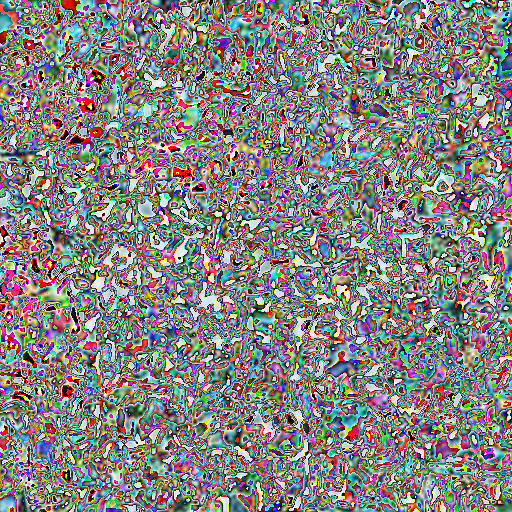

After 30 steps


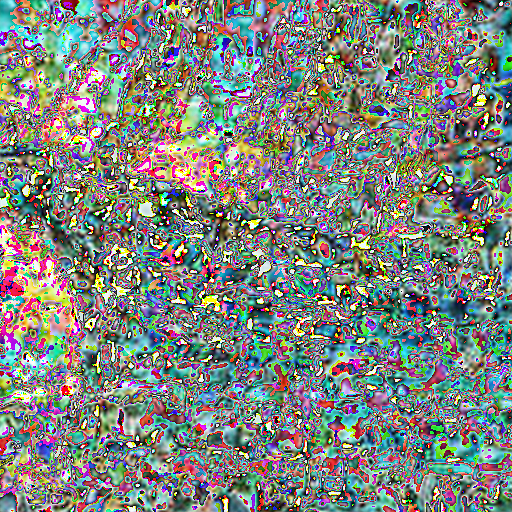

After 40 steps


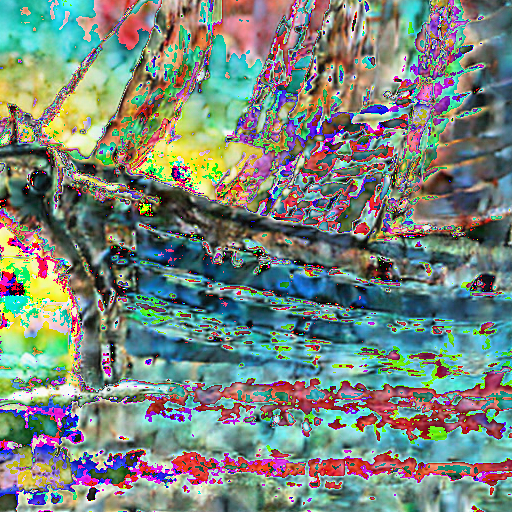

In [22]:
for i, latent in enumerate(keep_latents):
	print(f"After {i*10} steps")
	image = pipe.vae.decode(latent / pipe.vae.config.scaling_factor)[0]
	display(tensor_to_image(image[0]))

#### Write vae_decode function

In [23]:
def denormalize(image):
	return (image / 2 + 0.5).clamp(0, 1)

@torch.no_grad()
def vae_decode(latents):
	image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor)[0][0]
	image = denormalize(image)
	image = tensor_to_image(image)
	return image

#### Overwrite vae_decode of __call__

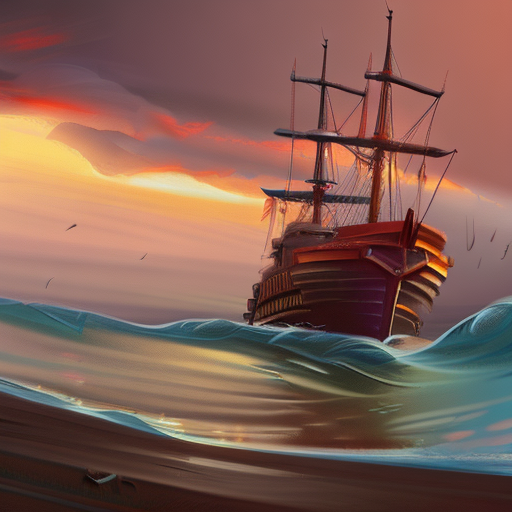

In [24]:
@torch.no_grad()
def __call__(
	prompt="",
	height=512,
	width=512,
	num_inference_steps=50,
	guidance_scale=7.5,
):
	pipe._guidance_scale = guidance_scale
	pipe._guidance_rescale = 0.0
	pipe._clip_skip = None
	pipe._cross_attention_kwargs = None
	pipe._interrupt = False

	# 3. OVERWRITE Encode input prompt
	prompt_embeds, negative_prompt_embeds = encode_prompt(prompt)

	prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])

	# 5. OVERWRITE Prepare latent variables
	latent = get_latent(width, height) # Shape: (4, 64, 64)
	latents = latent.unsqueeze(dim=0) # Shape: (1, 4, 64, 64)

	# 7. OVERWRITE Denoising loop
	latents = denoise(latents, prompt_embeds, num_inference_steps)

	image = vae_decode(latents)

	return image


prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"

image = __call__(prompt=prompt)
display(image)

## Part 3: Create a PareDiffusionPipeline

### Part 3.1: Write PareDiffusionPipeline by using pipe: StableDiffusionPipeline

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

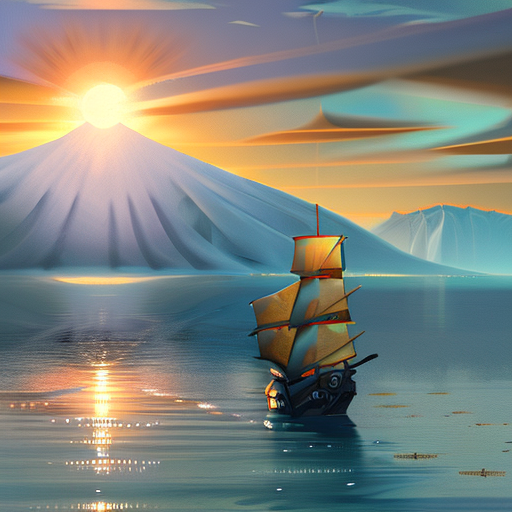

In [25]:
import torch
from torchvision.transforms import ToPILImage
from diffusers import StableDiffusionPipeline

class PareDiffusionPipeline():
	def __init__(
        self,
		pipe: StableDiffusionPipeline,
		device: torch.device = torch.device("cuda"),
		dtype: torch.dtype = torch.float16,
	):
		self.pipe = pipe
		self.device = device
		self.dtype = dtype
	
	def encode_prompt(self, prompt: str):
		text_inputs = pipe.tokenizer(
			prompt,
			padding="max_length",
			max_length=pipe.tokenizer.model_max_length,
			truncation=True,
			return_tensors="pt",
		)
		text_input_ids = text_inputs.input_ids

		attention_mask = None

		# prompt_embeds
		prompt_embeds = pipe.text_encoder(text_input_ids.to(self.device), attention_mask=attention_mask)[0]
		prompt_embeds = prompt_embeds.to(dtype=self.dtype, device=self.device)
		bs_embed, seq_len, _ = prompt_embeds.shape
		prompt_embeds = prompt_embeds.repeat(1, 1, 1)
		prompt_embeds = prompt_embeds.view(bs_embed * 1, seq_len, -1)

		# negative_prompt_embeds
		max_length = prompt_embeds.shape[1]
		uncond_input = pipe.tokenizer(
			[''],
			padding="max_length",
			max_length=max_length,
			truncation=True,
			return_tensors="pt",
		)
		attention_mask = None
		negative_prompt_embeds = pipe.text_encoder(
			uncond_input.input_ids.to(device),
			attention_mask=attention_mask,
		)[0]
		seq_len = negative_prompt_embeds.shape[1]
		negative_prompt_embeds = negative_prompt_embeds.to(dtype=self.dtype, device=self.device)
		negative_prompt_embeds = negative_prompt_embeds.repeat(1, 1, 1)
		negative_prompt_embeds = negative_prompt_embeds.view(1, seq_len, -1)

		# Concatenate
		prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])
		return prompt_embeds
	
	def get_latent(self, width: int, height: int):
		return torch.randn((4, width // 8, height // 8)).to(
			device=self.device, dtype=self.dtype
		)
	
	def retrieve_timesteps(
		self,
		scheduler,
		num_inference_steps=None,
	):
		scheduler.set_timesteps(num_inference_steps, device=self.device)
		timesteps = scheduler.timesteps
		return timesteps, num_inference_steps
	
	@torch.no_grad()
	def denoise(
		self,
		latents,
		prompt_embeds,
		num_inference_steps:int = 50,
		guidance_scale:int = 7.5,
	):
		timesteps, num_inference_steps = self.retrieve_timesteps(
			pipe.scheduler, num_inference_steps
		)

		for t in timesteps:
			latent_model_input = torch.cat([latents] * 2)
			latent_model_input = pipe.scheduler.scale_model_input(
				latent_model_input, t)

			# predict the noise residual
			noise_pred = pipe.unet(
				latent_model_input,
				t,
				encoder_hidden_states=prompt_embeds,
				return_dict=False,
			)[0]

			# perform guidance
			noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
			noise_pred = noise_pred_uncond + guidance_scale * \
				(noise_pred_text - noise_pred_uncond)

			# compute the previous noisy sample x_t -> x_t-1
			latents = pipe.scheduler.step(
				noise_pred, t, latents, return_dict=False
			)[0]
		return latents

	def denormalize(self, image):
		return (image / 2 + 0.5).clamp(0, 1)
	
	def tensor_to_image(self, tensor):
		return ToPILImage()(tensor.detach().cpu())
	
	@torch.no_grad()
	def vae_decode(self, latents):
		image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor)[0][0]
		image = self.denormalize(image)
		image = self.tensor_to_image(image)
		return image
	
	@torch.no_grad()
	def __call__(
		self,
		prompt: str,
		height: int = 512,
		width: int = 512,
		num_inference_steps: int = 50,
		guidance_scale: int = 7.5,
	):
		prompt_embeds = self.encode_prompt(prompt)
		latents = self.get_latent(width, height).unsqueeze(dim=0)
		latents = self.denoise(latents, prompt_embeds, num_inference_steps, guidance_scale)
		image = self.vae_decode(latents)
		return image


device = torch.device("cuda")
dtype = torch.float16
model_name = "stabilityai/stable-diffusion-2"
pipe = StableDiffusionPipeline.from_pretrained(model_name).to(
	device=device,
	dtype=dtype,
)
pare_pipe = PareDiffusionPipeline(pipe)

prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"
image = pare_pipe(prompt)
display(image)

### Part 3.2: Rewrite some pipe functions

#### pipe.tokenizer

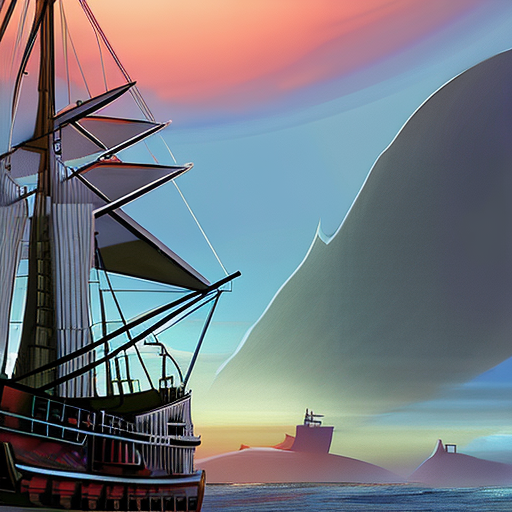

In [26]:
from transformers import CLIPTokenizer

pipe.tokenizer = CLIPTokenizer.from_pretrained(
	model_name,
	subfolder="tokenizer",
)
pare_pipe = PareDiffusionPipeline(pipe)

prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"
image = pare_pipe(prompt)
display(image)

#### pipe.text_encoder

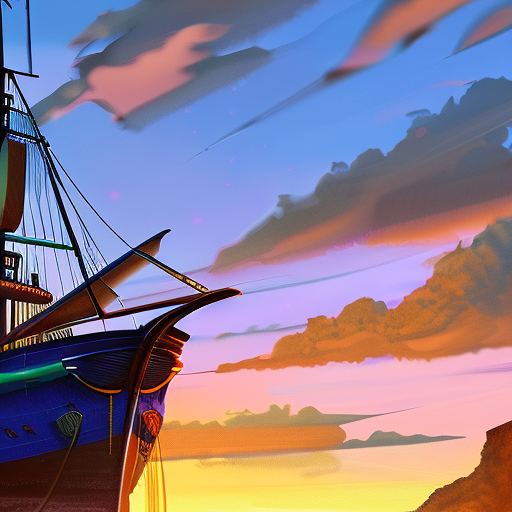

In [27]:
from transformers import CLIPTextModel

pipe.text_encoder = CLIPTextModel.from_pretrained(
	model_name,
	subfolder="text_encoder",
).to(device=device, dtype=dtype)
pare_pipe = PareDiffusionPipeline(pipe)

prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"
image = pare_pipe(prompt)
display(image)

#### pipe.scheduler

/usr/local/lib/python3.10/dist-packages/diffusers/configuration_utils.py:244: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a scheduler, please use <class 'diffusers.schedulers.scheduling_ddim.DDIMScheduler'>.from_pretrained(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)


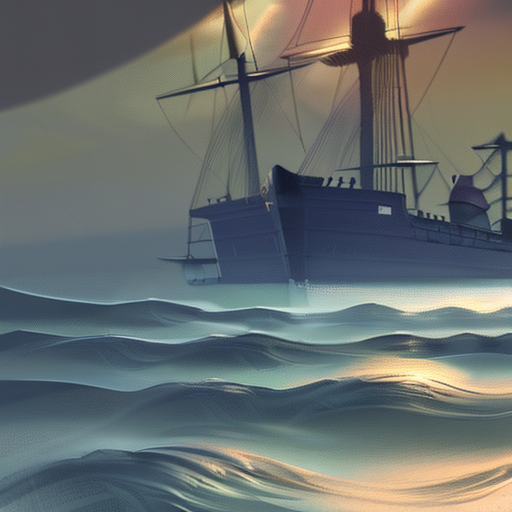

In [28]:
from diffusers import DDIMScheduler

pipe.scheduler = DDIMScheduler.from_config(
	model_name,
	subfolder="scheduler",
)
pare_pipe = PareDiffusionPipeline(pipe)

prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"
image = pare_pipe(prompt)
display(image)

#### pipe.unet

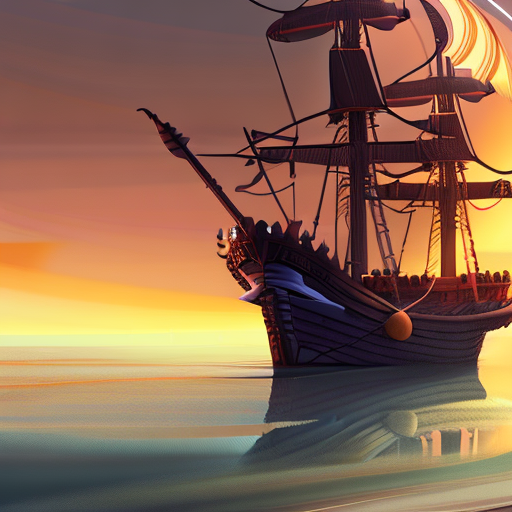

In [29]:
from diffusers import UNet2DConditionModel

pipe.unet = UNet2DConditionModel.from_pretrained(
	model_name,
	subfolder="unet",
).to(device=device, dtype=dtype)
pare_pipe = PareDiffusionPipeline(pipe)

prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"
image = pare_pipe(prompt)
display(image)

#### pipe.vae

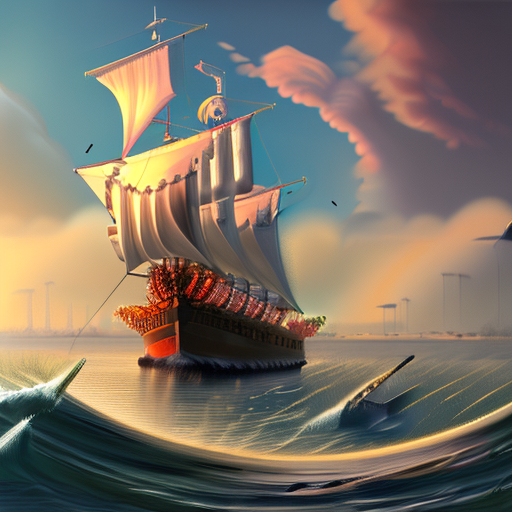

In [30]:
from diffusers import AutoencoderKL

pipe.vae = AutoencoderKL.from_pretrained(
	model_name,
	subfolder="vae",
).to(device=device, dtype=dtype)
pare_pipe = PareDiffusionPipeline(pipe)

prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"
image = pare_pipe(prompt)
display(image)

### Part 3.3: Rewrite PareDiffusionPipeline without pipe

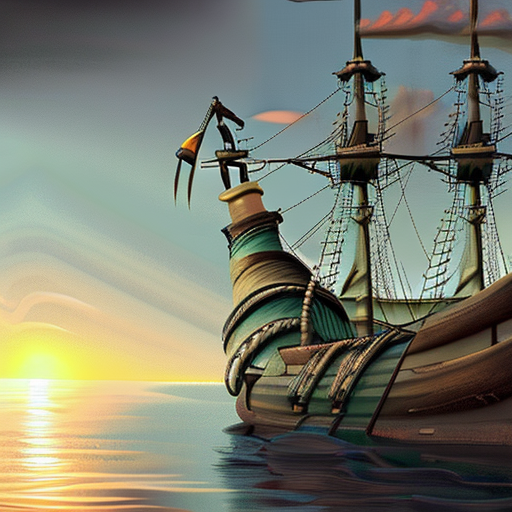

In [31]:
import torch
from torchvision.transforms import ToPILImage
from transformers import CLIPTokenizer, CLIPTextModel
from diffusers import DDIMScheduler, UNet2DConditionModel, AutoencoderKL

class PareDiffusionPipeline():
	def __init__(self, tokenizer, text_encoder, scheduler, unet, vae, device=torch.device("cuda"), dtype=torch.float16):
		# Initialize all components of the diffusion pipeline
		self.tokenizer = tokenizer
		self.text_encoder = text_encoder.to(device=device, dtype=dtype)
		self.scheduler = scheduler
		self.unet = unet.to(device=device, dtype=dtype)
		self.vae = vae.to(device=device, dtype=dtype)
		self.device = device
		self.dtype = dtype

	@classmethod
	def from_pretrained(cls, model_name, device=torch.device("cuda"), dtype=torch.float16):
		# Load all the necessary components from the pretrained model
		tokenizer = CLIPTokenizer.from_pretrained(model_name, subfolder="tokenizer")
		text_encoder = CLIPTextModel.from_pretrained(model_name, subfolder="text_encoder")
		scheduler = DDIMScheduler.from_config(model_name, subfolder="scheduler")
		unet = UNet2DConditionModel.from_pretrained(model_name, subfolder="unet")
		vae = AutoencoderKL.from_pretrained(model_name, subfolder="vae")
		return cls(tokenizer, text_encoder, scheduler, unet, vae, device, dtype)
	
	def encode_prompt(self, prompt: str):
		text_inputs = self.tokenizer(
			prompt,
			padding="max_length",
			max_length=self.tokenizer.model_max_length,
			truncation=True,
			return_tensors="pt",
		)
		text_input_ids = text_inputs.input_ids

		attention_mask = None

		# prompt_embeds
		prompt_embeds = self.text_encoder(text_input_ids.to(self.device), attention_mask=attention_mask)[0]
		prompt_embeds = prompt_embeds.to(dtype=self.dtype, device=self.device)
		bs_embed, seq_len, _ = prompt_embeds.shape
		prompt_embeds = prompt_embeds.repeat(1, 1, 1)
		prompt_embeds = prompt_embeds.view(bs_embed * 1, seq_len, -1)

		# negative_prompt_embeds
		max_length = prompt_embeds.shape[1]
		uncond_input = self.tokenizer(
			[''],
			padding="max_length",
			max_length=max_length,
			truncation=True,
			return_tensors="pt",
		)
		attention_mask = None
		negative_prompt_embeds = self.text_encoder(
			uncond_input.input_ids.to(device),
			attention_mask=attention_mask,
		)[0]
		seq_len = negative_prompt_embeds.shape[1]
		negative_prompt_embeds = negative_prompt_embeds.to(dtype=self.dtype, device=self.device)
		negative_prompt_embeds = negative_prompt_embeds.repeat(1, 1, 1)
		negative_prompt_embeds = negative_prompt_embeds.view(1, seq_len, -1)

		# Concatenate
		prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])
		return prompt_embeds
	
	def get_latent(self, width: int, height: int):
		return torch.randn((4, width // 8, height // 8)).to(
			device=self.device, dtype=self.dtype
		)
	
	def retrieve_timesteps(
		self,
		scheduler,
		num_inference_steps=None,
	):
		scheduler.set_timesteps(num_inference_steps, device=self.device)
		timesteps = scheduler.timesteps
		return timesteps, num_inference_steps
	
	@torch.no_grad()
	def denoise(
		self,
		latents,
		prompt_embeds,
		num_inference_steps:int = 50,
		guidance_scale:int = 7.5,
	):
		timesteps, num_inference_steps = self.retrieve_timesteps(
			self.scheduler, num_inference_steps
		)

		for t in timesteps:
			latent_model_input = torch.cat([latents] * 2)
			latent_model_input = self.scheduler.scale_model_input(
				latent_model_input, t)

			# predict the noise residual
			noise_pred = self.unet(
				latent_model_input,
				t,
				encoder_hidden_states=prompt_embeds,
				return_dict=False,
			)[0]

			# perform guidance
			noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
			noise_pred = noise_pred_uncond + guidance_scale * \
				(noise_pred_text - noise_pred_uncond)

			# compute the previous noisy sample x_t -> x_t-1
			latents = self.scheduler.step(
				noise_pred, t, latents, return_dict=False
			)[0]
		return latents

	def denormalize(self, image):
		return (image / 2 + 0.5).clamp(0, 1)
	
	def tensor_to_image(self, tensor):
		return ToPILImage()(tensor.detach().cpu())
	
	@torch.no_grad()
	def vae_decode(self, latents):
		image = self.vae.decode(latents / self.vae.config.scaling_factor)[0][0]
		image = self.denormalize(image)
		image = self.tensor_to_image(image)
		return image
	
	@torch.no_grad()
	def __call__(
		self,
		prompt: str,
		height: int = 512,
		width: int = 512,
		num_inference_steps: int = 50,
		guidance_scale: int = 7.5,
	):
		prompt_embeds = self.encode_prompt(prompt)
		latents = self.get_latent(width, height).unsqueeze(dim=0)
		latents = self.denoise(latents, prompt_embeds, num_inference_steps, guidance_scale)
		image = self.vae_decode(latents)
		return image


device = torch.device("cuda")
dtype = torch.float16
model_name = "stabilityai/stable-diffusion-2"

pare_pipe = PareDiffusionPipeline.from_pretrained(model_name)

prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"
image = pare_pipe(prompt)
display(image)

#### Part 3.4: Clean up PareDiffusionPipeline code.

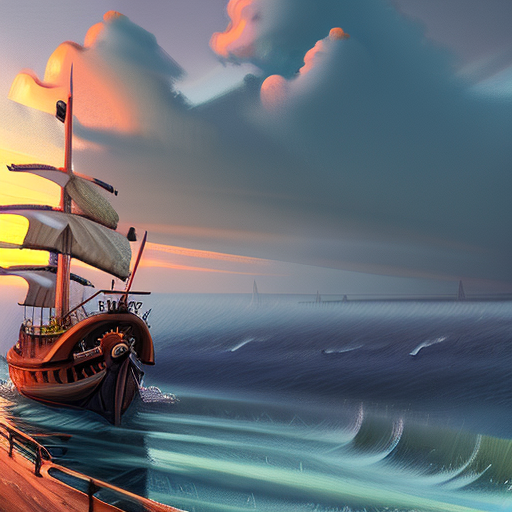

In [32]:
import torch
from torchvision.transforms import ToPILImage
from transformers import CLIPTokenizer, CLIPTextModel
from diffusers import DDIMScheduler, UNet2DConditionModel, AutoencoderKL

class PareDiffusionPipeline:
	def __init__(self, tokenizer, text_encoder, scheduler, unet, vae, device=torch.device("cuda"), dtype=torch.float16):
		"""
		Initialize the diffusion pipeline components.
		"""
		self.tokenizer = tokenizer
		self.text_encoder = text_encoder.to(device=device, dtype=dtype)
		self.scheduler = scheduler
		self.unet = unet.to(device=device, dtype=dtype)
		self.vae = vae.to(device=device, dtype=dtype)
		self.device = device
		self.dtype = dtype

	@classmethod
	def from_pretrained(cls, model_name, device=torch.device("cuda"), dtype=torch.float16):
		"""
		Load all necessary components from the pretrained model.

		Args:
			model_name (str): The name of the pretrained model.
			device (torch.device, optional): The device to use for the pipeline. Defaults to torch.device("cuda").
			dtype (torch.dtype, optional): The dtype to use for the pipeline. Defaults to torch.float16.
		
		Returns:
			PareDiffusionPipeline: The initialized pipeline.
		"""
		tokenizer = CLIPTokenizer.from_pretrained(model_name, subfolder="tokenizer")
		text_encoder = CLIPTextModel.from_pretrained(model_name, subfolder="text_encoder")
		scheduler = DDIMScheduler.from_config(model_name, subfolder="scheduler")
		unet = UNet2DConditionModel.from_pretrained(model_name, subfolder="unet")
		vae = AutoencoderKL.from_pretrained(model_name, subfolder="vae")
		return cls(tokenizer, text_encoder, scheduler, unet, vae, device, dtype)

	def encode_prompt(self, prompt: str):
		"""
		Encode the text prompt into embeddings using the text encoder.
		"""
		prompt_embeds = self.get_embes(prompt, self.tokenizer.model_max_length)
		negative_prompt_embeds = self.get_embes([''], prompt_embeds.shape[1])
		prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])
		return prompt_embeds

	def get_embes(self, prompt, max_length):
		"""
		Encode the text prompt into embeddings using the text encoder.
		"""
		text_inputs = self.tokenizer(prompt, padding="max_length", max_length=max_length, truncation=True, return_tensors="pt")
		text_input_ids = text_inputs.input_ids.to(self.device)
		prompt_embeds = self.text_encoder(text_input_ids)[0].to(dtype=self.dtype, device=self.device)
		return prompt_embeds

	def get_latent(self, width: int, height: int):
		"""
		Generate a random initial latent tensor to start the diffusion process.
		"""
		return torch.randn((4, width // 8, height // 8)).to(
			device=self.device, dtype=self.dtype
		)

	def retrieve_timesteps(self, num_inference_steps=None):
		"""
		Retrieve the timesteps for the diffusion process from the scheduler.
		"""
		self.scheduler.set_timesteps(num_inference_steps, device=self.device)
		timesteps = self.scheduler.timesteps
		return timesteps, num_inference_steps

	@torch.no_grad()
	def denoise(self, latents, prompt_embeds, num_inference_steps=50, guidance_scale=7.5):
		"""
		Iteratively denoise the latent space using the diffusion model to produce an image.
		"""
		timesteps, num_inference_steps = self.retrieve_timesteps(num_inference_steps)
	
		for t in timesteps:
			latent_model_input = torch.cat([latents] * 2)
			scaled_latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)

			# Predict the noise residual for the current timestep
			noise_residual = self.unet(scaled_latent_model_input, t, encoder_hidden_states=prompt_embeds)[0]
			uncond_residual, text_cond_residual = noise_residual.chunk(2)
			guided_noise_residual = uncond_residual + guidance_scale * (text_cond_residual - uncond_residual)

			# Update latents by reversing the diffusion process for the current timestep
			latents = self.scheduler.step(guided_noise_residual, t, latents, return_dict=False)[0]

		return latents
	
	def denormalize(self, image):
		"""
		Denormalize the image tensor to the range [0, 255].
		"""
		return (image / 2 + 0.5).clamp(0, 1)

	def tensor_to_image(self, tensor):
		"""
		Convert a tensor to a PIL Image.
		"""
		return ToPILImage()(tensor.detach().cpu())

	@torch.no_grad()
	def vae_decode(self, latents):
		"""
		Decode the latent tensors using the VAE to produce an image.
		"""
		image = self.vae.decode(latents / self.vae.config.scaling_factor)[0][0]
		image = self.denormalize(image)
		image = self.tensor_to_image(image)
		return image

	def __call__(self, prompt: str, height: int = 512, width: int = 512, num_inference_steps: int = 50, guidance_scale: int = 7.5):
		"""
		Generate an image from a text prompt using the entire pipeline.

		Args:
			prompt (str): The text prompt to generate an image from.
			height (int, optional): The height of the generated image. Defaults to 512.
			width (int, optional): The width of the generated image. Defaults to 512.
			num_inference_steps (int, optional): The number of diffusion steps to perform. Defaults to 50.
			guidance_scale (int, optional): The scale of the guidance. Defaults to 7.5.
		
		Returns:
			PIL.Image: The generated image.
		"""
		prompt_embeds = self.encode_prompt(prompt)
		latents = self.get_latent(width, height).unsqueeze(dim=0)
		latents = self.denoise(latents, prompt_embeds, num_inference_steps, guidance_scale)
		image = self.vae_decode(latents)
		return image

# Example usage
device = torch.device("cuda")
dtype = torch.float16
model_name = "stabilityai/stable-diffusion-2"

pare_pipe = PareDiffusionPipeline.from_pretrained(model_name, device=device, dtype=dtype)
prompt = "painting depicting the sea, sunrise, ship, artstation, 4k, concept art"
image = pare_pipe(prompt)
display(image)
